In [1]:
# === BLOQUE 1: Importar librerías ===
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping

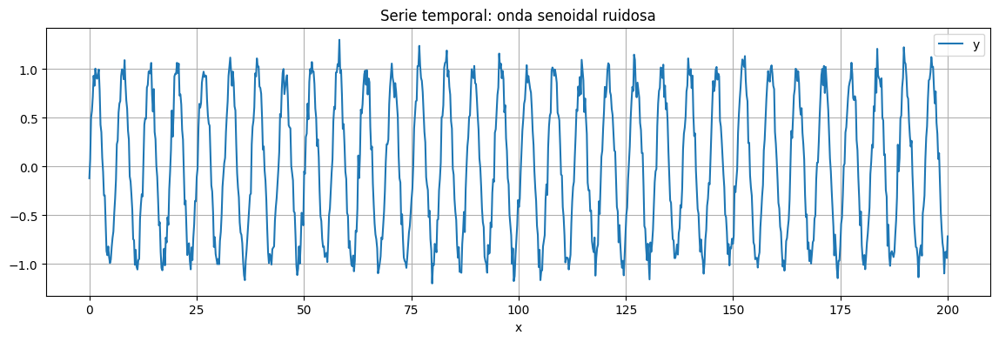

In [59]:
# === BLOQUE 2: Crear una serie temporal artificial ===
def generate_sine_wave(seq_length=1000):
    x = np.linspace(0, 200, seq_length)
    y = np.sin(x) + np.random.normal(0, 0.1, seq_length)  # Onda senoidal con ruido
    return pd.DataFrame({'x': x, 'y': y})

data = generate_sine_wave()
data.plot(x='x', y='y', title='Serie temporal: onda senoidal ruidosa', figsize=(14, 4))
plt.grid(True)
plt.show()

In [60]:
# === BLOQUE 3: Preprocesamiento de datos ===
scaler = MinMaxScaler()
data['y_scaled'] = scaler.fit_transform(data[['y']])

# Crear secuencias de entrenamiento
def create_sequences(series, window_size):
    X, y = [], []
    for i in range(len(series) - window_size):
        X.append(series[i:i+window_size])
        y.append(series[i+window_size])
    return np.array(X), np.array(y)

window_size = 20
X, y = create_sequences(data['y_scaled'].values, window_size)
X = X.reshape((X.shape[0], X.shape[1], 1))  # [samples, timesteps, features]

print("Forma de X:", X.shape)
print("Forma de y:", y.shape)

Forma de X: (980, 20, 1)
Forma de y: (980,)


In [61]:
# === BLOQUE 4: Dividir en entrenamiento y prueba ===
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

In [62]:
# === BLOQUE 5: Construcción del modelo LSTM ===
model = Sequential()
model.add(LSTM(50, activation='tanh', input_shape=(window_size, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 50)             │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,451 (40.82 KB)

 Trainable params: 10,451 (40.82 KB)

 Non-trainable params: 0 (0.00 B)

In [86]:
# === BLOQUE 6: Entrenamiento del modelo ===
es = EarlyStopping(patience=10, restore_best_weights=True)
history = model.fit(X_train, y_train, epochs=20, batch_size=32,
                    validation_split=0.2, callbacks=[es], verbose=1)

Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 8/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0020 - val_loss: 0.0015
Epoch 9/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0020 - val_loss: 0.0021
Epoch 10/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0023 - val_loss: 0.0015
Epoch 11/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0020 - val_loss: 0.0016
Epoch 12/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0

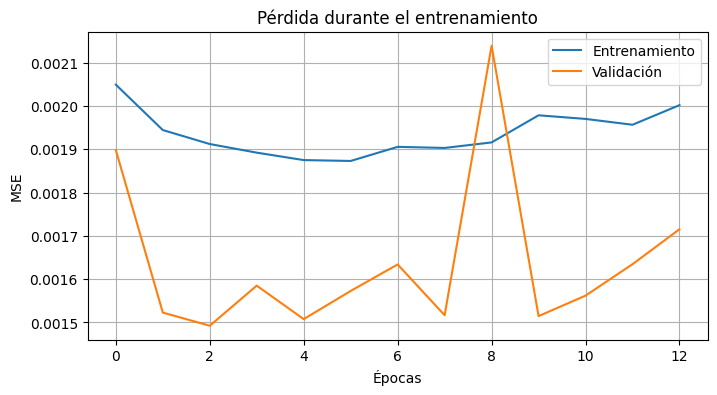

In [90]:
# === BLOQUE 7: Visualizar pérdida durante el entrenamiento ===
plt.figure(figsize=(8, 4))
plt.plot(history.history['loss'], label='Entrenamiento')
plt.plot(history.history['val_loss'], label='Validación')
plt.title('Pérdida durante el entrenamiento')
plt.xlabel('Épocas')
plt.ylabel('MSE')
plt.legend()
plt.grid(True)
plt.show()

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


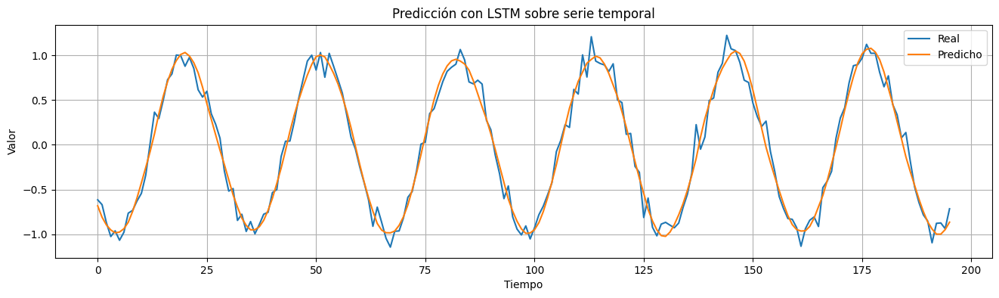

In [91]:
# === BLOQUE 8: Predicción y visualización ===
y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

plt.figure(figsize=(16, 4))
plt.plot(range(len(y_test_inv)), y_test_inv, label='Real')
plt.plot(range(len(y_pred_inv)), y_pred_inv, label='Predicho')
plt.title('Predicción con LSTM sobre serie temporal')
plt.xlabel('Tiempo')
plt.ylabel('Valor')
plt.legend()
plt.grid(True)
plt.show()

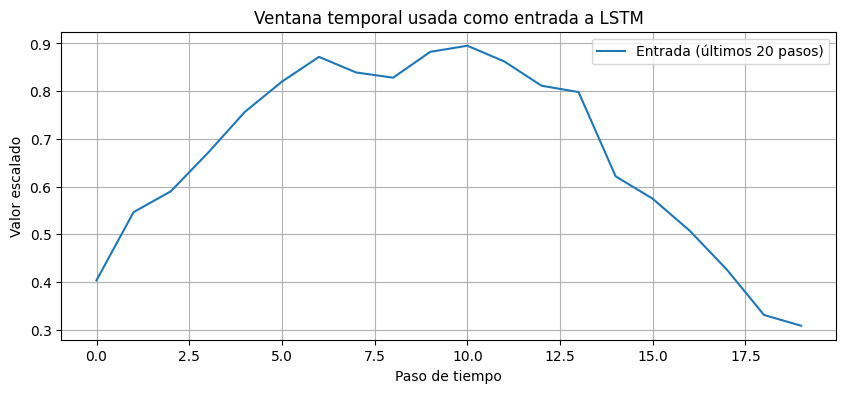

In [92]:
# === BLOQUE 9: Visualización de una ventana de entrada ===
plt.figure(figsize=(10, 4))
plt.plot(X_test[0].reshape(-1), label='Entrada (últimos 20 pasos)')
plt.title('Ventana temporal usada como entrada a LSTM')
plt.xlabel('Paso de tiempo')
plt.ylabel('Valor escalado')
plt.grid(True)
plt.legend()
plt.show()

In [94]:
# === BLOQUE 10: Evaluación final ===
mse = np.mean((y_test_inv - y_pred_inv)**2)
print(f"Error cuadrático medio final sobre el conjunto de prueba: {mse:.4f}")

Error cuadrático medio final sobre el conjunto de prueba: 0.0121


In [70]:
# === BLOQUE 11: Animación de la predicción ===
fig, ax = plt.subplots(figsize=(10, 4))
ax.set_title("Predicción de LSTM paso a paso")
ax.set_xlim(0, len(y_test_inv))
ax.set_ylim(np.min(y_test_inv), np.max(y_test_inv))
line_real, = ax.plot([], [], label='Real')
line_pred, = ax.plot([], [], label='Predicho')
plt.legend()
plt.grid(True)

real_vals, pred_vals = [], []

def update(frame):
    real_vals.append(y_test_inv[frame][0])
    pred_vals.append(y_pred_inv[frame][0])
    line_real.set_data(range(len(real_vals)), real_vals)
    line_pred.set_data(range(len(pred_vals)), pred_vals)
    return line_real, line_pred

ani = FuncAnimation(fig, update, frames=len(y_test_inv), interval=40, blit=True)
plt.close()
HTML(ani.to_jshtml())


## Comparación con RNN Tradicionales

In [76]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from tensorflow.keras.callbacks import EarlyStopping

# === Crear el modelo RNN ===
model_rnn = Sequential()
model_rnn.add(SimpleRNN(units=50, activation='tanh', input_shape=(X_train.shape[1], X_train.shape[2])))
model_rnn.add(Dense(1))  # Capa de salida

# === Compilar el modelo ===
model_rnn.compile(optimizer='adam', loss='mse')

# === Entrenar el modelo ===
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history_rnn = model_rnn.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0579 - val_loss: 0.0091
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0078 - val_loss: 0.0040
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0042 - val_loss: 0.0030
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030 - val_loss: 0.0023
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 8/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022 - val_loss: 0.0022
Epoch 9/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 10/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 11/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023 - val_loss: 0.0021
Epoch 12/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0021 - val_loss: 0.002

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


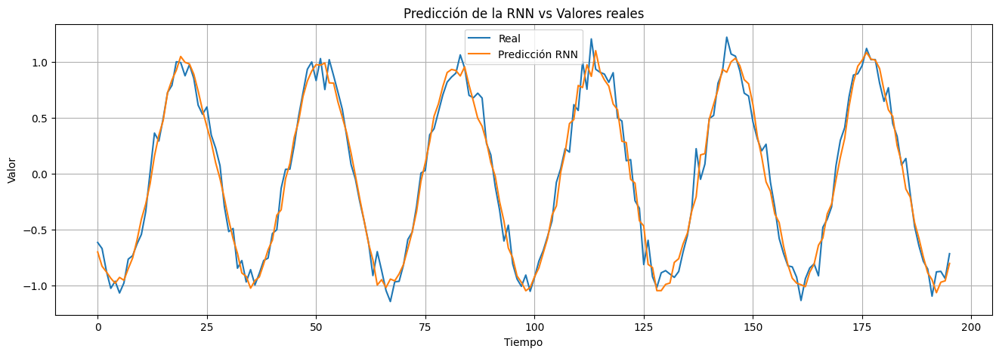

In [77]:
# === Realizar predicciones ===
y_pred_rnn = model_rnn.predict(X_test)

# === (Opcional) Invertir escala si usaste MinMaxScaler ===
y_pred_rnn_inv = scaler.inverse_transform(y_pred_rnn)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

plt.figure(figsize=(16, 5))
plt.plot(y_test_inv, label="Real")
plt.plot(y_pred_rnn_inv, label="Predicción RNN")
plt.title("Predicción de la RNN vs Valores reales")
plt.xlabel("Tiempo")
plt.ylabel("Valor")
plt.legend()
plt.grid(True)
plt.show()

In [95]:
# === BLOQUE 10: Evaluación final RNN ===
mse = np.mean((y_test_inv - y_pred_rnn_inv)**2)
print(f"Error cuadrático medio final sobre el conjunto de prueba: {mse:.4f}")

Error cuadrático medio final sobre el conjunto de prueba: 0.0153
